In [1]:
#pip install textract
#pip install docx
#pip install python-docx 
#pip install antiword
#pip install pdftotext
#pip install PyPDF2

In [2]:

import nltk
import pandas as pd
import PyPDF2
import matplotlib.pyplot as plt
import re
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords, wordnet
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns
import numpy as np
import csv
import warnings
import os
import textract
import docx2txt
import antiword
from docx import Document
import win32com.client as win32
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
import seaborn as sns
from wordcloud import WordCloud

from sklearn.preprocessing import LabelEncoder


warnings.filterwarnings('ignore')



In [3]:
df = pd.read_csv('converted_resumes.csv')

In [4]:
df.tail(10)

,Resumes,Category
69,Aradhana Tripathi\n\n\n\nCurrent Location: Gac...,SQL Developer Lightning Insight Resume
70,BUDDHA VAMSI ...,SQL Developer Lightning Insight Resume
71,KAMBALLA PRADEEP ...,SQL Developer Lightning Insight Resume
72,Resume\n\nName : Neeraj Mishra\n\n\n\nExp...,SQL Developer Lightning Insight Resume
73,SQL DEVELOPER\n\nName: - Bandi prem sai\n\n\...,SQL Developer Lightning Insight Resume
74,SQL SERVER DEVELOPER\n\n\n\n\n\nP. Syam Kumar ...,SQL Developer Lightning Insight Resume
75,RAJU PAVANA KUMARI\n\n\n\n\t\n\n\tProfessional...,SQL Developer Lightning Insight Resume
76,resume\n\n\n\n\n\n\t\t\t\t\t\t\t\t\t\t\t\tRama...,SQL Developer Lightning Insight Resume
77,Name: Ramesh\n\n\t\n\n\tCareer Objective: \n\n...,SQL Developer Lightning Insight Resume
78,SQL AND MSBI DEVELOPER\n\nSQL AND MSBI DEVELOP...,SQL Developer Lightning Insight Resume


In [5]:
df.describe()

,Resumes,Category
count,79,79
unique,79,4
top,Name: Ravali P \n\n\n\n ...,React JS Developer Resume
freq,1,24


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Resumes   79 non-null     object
 1   Category  79 non-null     object
dtypes: object(2)
memory usage: 1.4+ KB


In [7]:
df[df.duplicated("Resumes")]

,Resumes,Category


In [8]:
def clean_text(text):
    

    # Remove links
    text = re.sub(r'http\S+', ' ', text)
    
    # Remove punctuations
    text = re.sub(r'[^\w\s]', ' ', text)
    
    # Remove non-english alphabets
    text = ''.join([i for i in text if i.isalpha() or i.isspace()])
    
    # Remove numbers
    text = re.sub(r'\d+', ' ', text)
    
    text = text.lower()

    # Tokenize the text
    tokens = nltk.word_tokenize(text)

    # Remove stopwords and lemmatize the remaining words
    lemma= WordNetLemmatizer()
    stop_words = nltk.corpus.stopwords.words("english")


    nouns = [token for token in tokens if nltk.pos_tag([token])[0][1] == "NOUN"]
    tokens = [lemma.lemmatize(i) for i in tokens if not i in stop_words and i not in nouns]
    
    # Join the tokens back into a string
    text = ' '.join(tokens)

    return text


In [9]:
# applying function on resumes

df['Resumes']= df['Resumes'].apply(clean_text)
df

,Resumes,Category
0,name ravali p curriculum vitae specialization ...,React JS Developer Resume
1,susovan bag seeking challenging position field...,React JS Developer Resume
2,kanumuru deepak reddy career objective secure ...,React JS Developer Resume
3,haripriya battina experience ui developer reac...,React JS Developer Resume
4,kamalakar reddy linked professional summary ye...,React JS Developer Resume
...,...,...
74,sql server developer p syam kumar professional...,SQL Developer Lightning Insight Resume
75,raju pavana kumari professional summary year p...,SQL Developer Lightning Insight Resume
76,resume ramalakshmi k career objective professi...,SQL Developer Lightning Insight Resume
77,name ramesh career objective contribute organi...,SQL Developer Lightning Insight Resume


In [10]:
df['Category'].value_counts()

React JS Developer Resume                 24
Workday Resume                            21
PeopleSoft Resume                         20
SQL Developer Lightning Insight Resume    14
Name: Category, dtype: int64

In [11]:
plt.rcParams['figure.figsize']= (12,6)
sns.set_style(style='darkgrid')


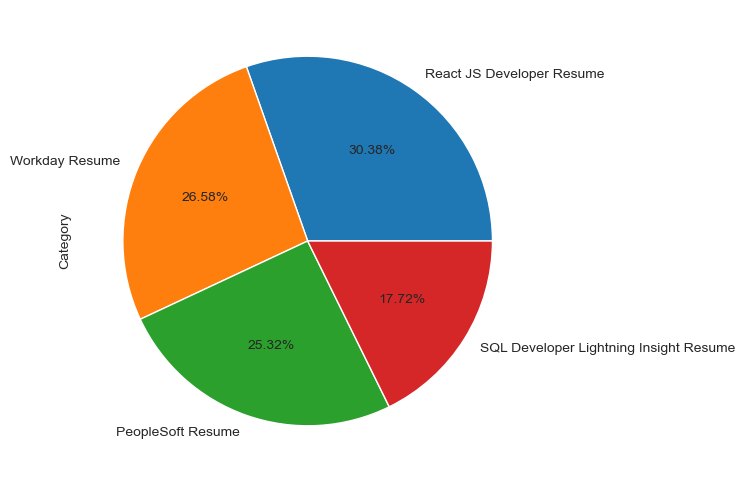

In [12]:
df['Category'].value_counts().plot(kind='pie', autopct='%0.2f%%') 
plt.show()

- Here the data is approximately balanced, so we may not face multicoliniarity issue.

In [13]:
workday = df[df['Category']=='Workday Resume']
reactjs = df[df['Category']=='React JS Developer Resume']
sqldeveloper = df[df['Category']=='SQL Developer Lightning Insight Resume']
peoplesoft = df[df['Category']=='PeopleSoft Resume']

In [14]:
df['Length']= df['Resumes'].apply(lambda x:len(nltk.word_tokenize(x)))

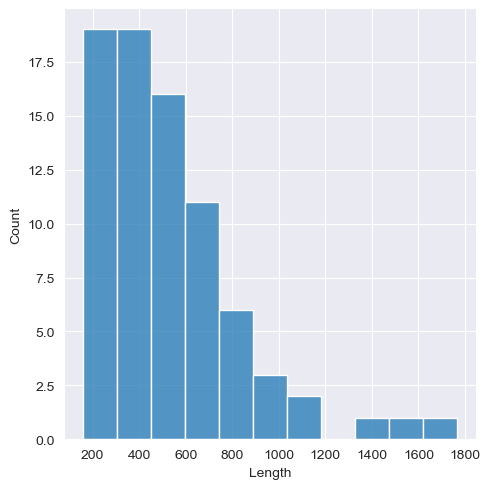

In [15]:
sns.displot(df['Length'])
plt.show()

- this way of analysis is not showing any proper result.
- Most of the resumes are consist of 200 and 400

In [16]:
from nltk.corpus import stopwords
import string

In [17]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = df['Resumes'].values
cleanedSentences = ""
for i in range(0,77):
    cleanedText = clean_text(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(200)
print(mostcommon)

[('experience', 578), ('application', 532), ('server', 477), ('peoplesoft', 453), ('report', 452), ('workday', 431), ('project', 381), ('using', 374), ('integration', 367), ('data', 315), ('process', 297), ('database', 292), ('system', 281), ('business', 268), ('web', 249), ('sql', 229), ('tool', 229), ('client', 221), ('worked', 219), ('role', 215), ('knowledge', 213), ('service', 201), ('requirement', 200), ('environment', 199), ('team', 189), ('involved', 188), ('hcm', 182), ('c', 179), ('technology', 179), ('support', 178), ('skill', 174), ('like', 168), ('good', 165), ('development', 161), ('design', 161), ('working', 159), ('people', 158), ('creating', 157), ('technical', 156), ('change', 154), ('responsibility', 152), ('user', 152), ('testing', 150), ('react', 148), ('developer', 147), ('domain', 144), ('created', 143), ('issue', 142), ('oracle', 142), ('eib', 142), ('various', 140), ('management', 134), ('security', 134), ('production', 133), ('j', 131), ('core', 128), ('work',

In [18]:
words0= []

for word, count in mostcommon:
    words0.append(word)

In [19]:
WORDCLOUD_COLOR_MAP = 'tab10_r'

In [20]:
def wordcl(data, title):
    stop = STOPWORDS
    wc = WordCloud(height=2000, width= 4000, colormap=WORDCLOUD_COLOR_MAP, stopwords=stop).generate(data)
    plt.imshow(wc)
    plt.axis('off')
    plt.title(title)

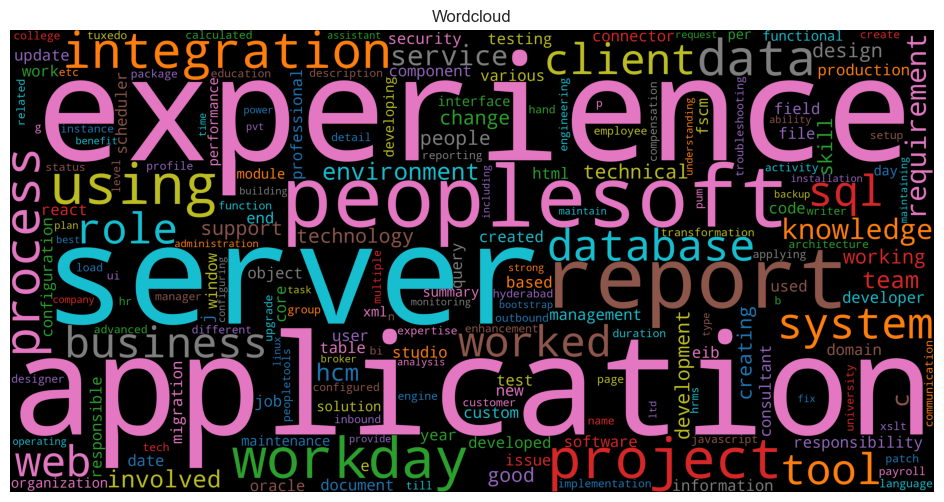

In [21]:
wordcl(" ".join(words0), "Wordcloud")

In [22]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = workday['Resumes'].values
cleanedSentences = ""
for i in range(len(workday)):
    cleanedText = clean_text(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('workday', 431), ('integration', 295), ('report', 285), ('business', 188), ('experience', 170), ('using', 147), ('eib', 142), ('process', 130), ('system', 120), ('core', 119), ('hcm', 116), ('worked', 110), ('connector', 109), ('requirement', 108), ('studio', 108), ('custom', 104), ('field', 101), ('data', 98), ('security', 93), ('client', 90), ('created', 89), ('document', 87), ('project', 86), ('support', 85), ('consultant', 81), ('service', 81), ('testing', 80), ('calculated', 75), ('xslt', 75), ('change', 75), ('inbound', 73), ('involved', 72), ('knowledge', 70), ('xml', 70), ('team', 68), ('role', 68), ('like', 68), ('creating', 66), ('developed', 64), ('good', 62), ('working', 61), ('technical', 61), ('outbound', 61), ('functional', 60), ('design', 60), ('skill', 59), ('compensation', 59), ('issue', 58), ('new', 57), ('transformation', 56)]


In [23]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = reactjs['Resumes'].values
cleanedSentences = ""
for i in range(len(reactjs)):
    cleanedText = clean_text(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('react', 148), ('j', 127), ('c', 104), ('project', 104), ('experience', 102), ('html', 95), ('using', 90), ('web', 76), ('application', 76), ('developer', 75), ('technology', 74), ('e', 70), ('javascript', 70), ('knowledge', 65), ('ui', 61), ('skill', 60), ('design', 55), ('n', 49), ('team', 49), ('good', 47), ('service', 44), ('bootstrap', 44), ('used', 43), ('development', 43), ('system', 42), ('work', 42), ('working', 39), ('component', 39), ('role', 38), ('end', 35), ('year', 34), ('responsibility', 33), ('software', 32), ('developing', 28), ('website', 28), ('redux', 28), ('management', 27), ('professional', 27), ('engineering', 27), ('designing', 27), ('code', 27), ('page', 27), ('client', 26), ('responsible', 26), ('technical', 25), ('front', 25), ('college', 24), ('date', 24), ('jquery', 24), ('customer', 23)]


In [24]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = sqldeveloper['Resumes'].values
cleanedSentences = ""
for i in range(len(sqldeveloper)):
    cleanedText = clean_text(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('sql', 226), ('data', 122), ('server', 109), ('experience', 103), ('using', 82), ('report', 81), ('table', 75), ('database', 72), ('query', 69), ('function', 61), ('project', 58), ('business', 45), ('knowledge', 45), ('bi', 44), ('service', 44), ('procedure', 44), ('system', 42), ('index', 38), ('view', 38), ('developer', 37), ('good', 37), ('role', 37), ('requirement', 37), ('tool', 37), ('power', 36), ('stored', 36), ('user', 36), ('ssis', 35), ('like', 34), ('client', 33), ('creating', 32), ('join', 32), ('development', 32), ('application', 32), ('date', 30), ('design', 30), ('developed', 30), ('trigger', 29), ('task', 28), ('technology', 28), ('skill', 27), ('package', 27), ('sub', 26), ('information', 26), ('technical', 25), ('working', 23), ('professional', 23), ('various', 23), ('etl', 22), ('created', 22)]


In [25]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = peoplesoft['Resumes'].values
cleanedSentences = ""
for i in range(len(peoplesoft)):
    cleanedText = clean_text(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('peoplesoft', 423), ('server', 394), ('application', 379), ('experience', 228), ('database', 207), ('process', 154), ('environment', 140), ('project', 139), ('tool', 137), ('people', 133), ('domain', 121), ('web', 118), ('oracle', 116), ('report', 111), ('scheduler', 106), ('data', 93), ('fscm', 90), ('support', 84), ('production', 80), ('system', 79), ('involved', 78), ('client', 77), ('role', 77), ('using', 76), ('migration', 75), ('worked', 75), ('update', 74), ('issue', 72), ('change', 72), ('window', 71), ('patch', 67), ('hcm', 66), ('c', 66), ('various', 61), ('user', 58), ('like', 58), ('configuration', 57), ('pum', 57), ('integration', 57), ('creating', 56), ('upgrade', 55), ('team', 55), ('setup', 54), ('troubleshooting', 54), ('r', 54), ('file', 53), ('peopletools', 53), ('development', 52), ('instance', 52), ('applying', 51)]


In [26]:
categories = np.sort(df['Category'].unique())
categories

array(['PeopleSoft Resume', 'React JS Developer Resume',
       'SQL Developer Lightning Insight Resume', 'Workday Resume'],
      dtype=object)

In [27]:
df_categories = [df[df['Category'] == category].loc[:, ['Resumes', 'Category']] for category in categories]



In [28]:
def wordcloud(df):
    txt = ' '.join(txt for txt in df['Resumes'])
    wordcloud = WordCloud(
        height=2000,
        width=4000,
        colormap=WORDCLOUD_COLOR_MAP
    ).generate(txt)

    return wordcloud

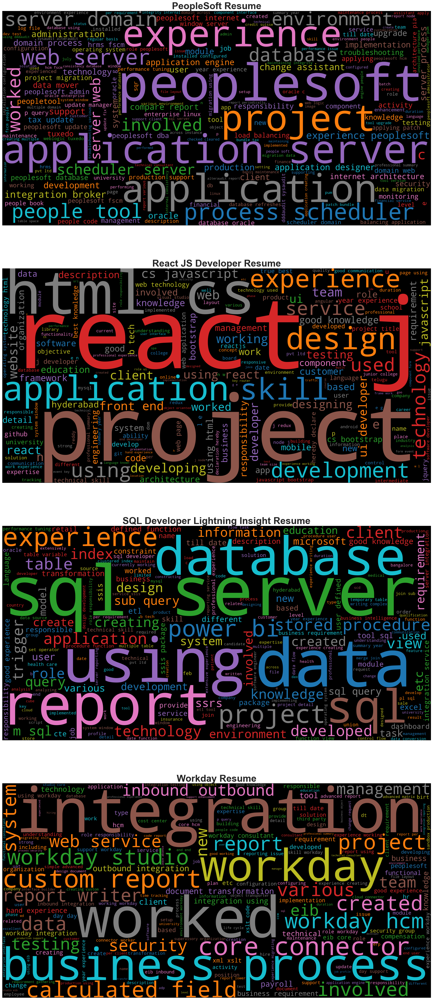

In [29]:
WORDCLOUD_COLOR_MAP = 'tab10_r'
plt.figure(figsize=(64, 56))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(4, 1, i + 1).set_title(category,fontsize=30,fontweight= 'bold')
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

# Unique Words

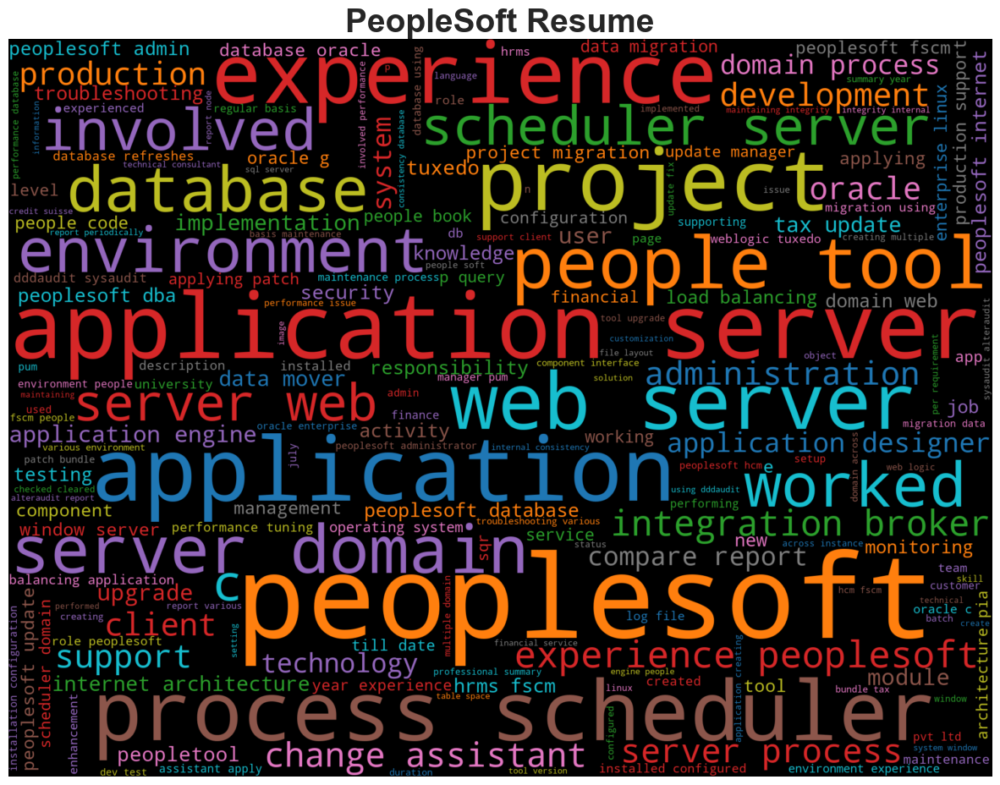

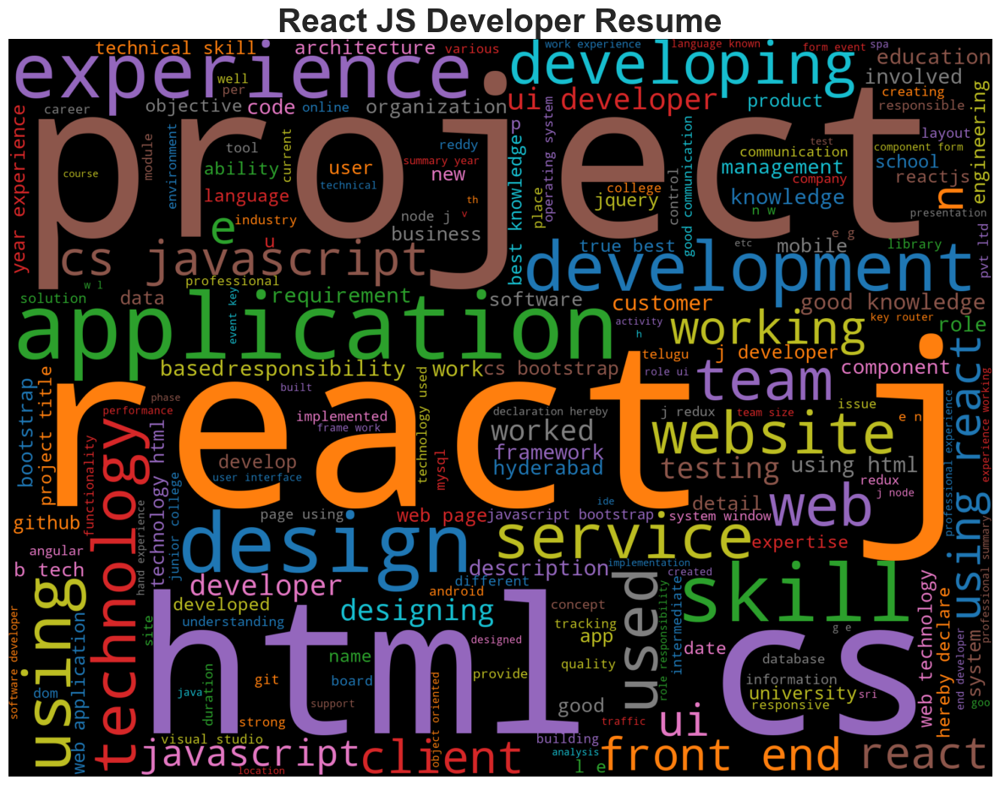

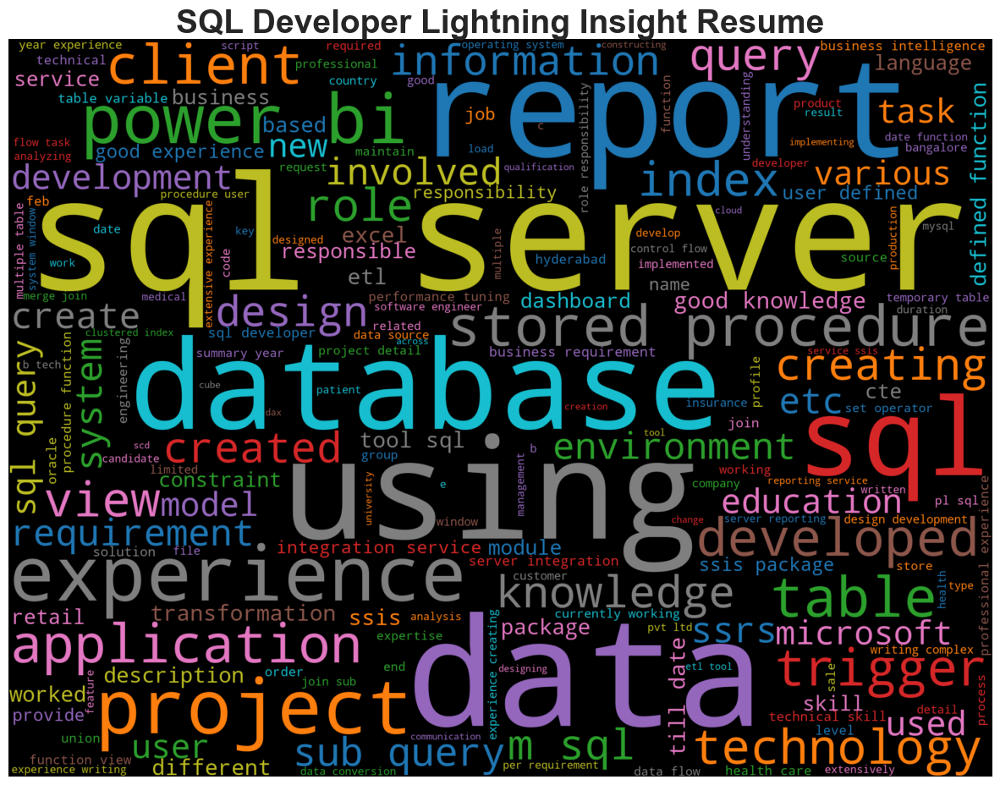

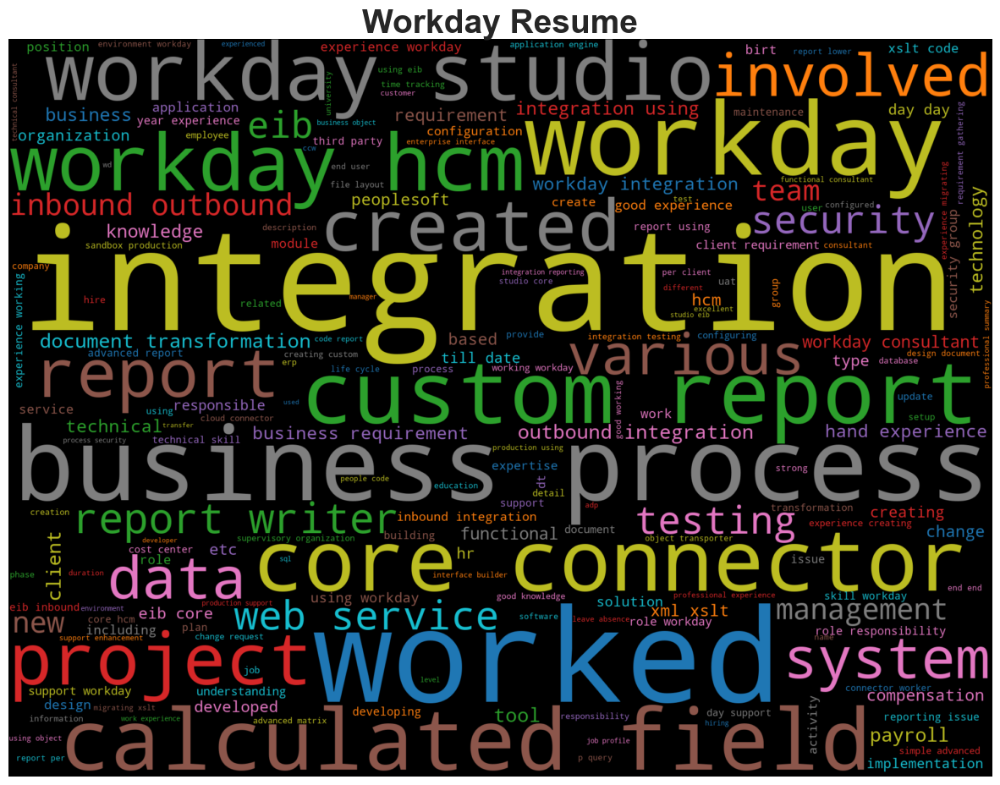

In [30]:
unique = df.groupby('Category')['Resumes'].apply(lambda x: ' '.join(x))

# Generate a word cloud for each group
for category, text in unique.items():
    wordcloud = WordCloud(height=1500,width=2000,colormap=WORDCLOUD_COLOR_MAP).generate(text)

    WORDCLOUD_COLOR_MAP = 'tab10_r'
    plt.figure(figsize=(15, 25))

    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(category,fontsize=28,fontweight= 'bold')
    plt.show()


In [31]:
from textblob import TextBlob

In [32]:
#TextBlob(df['Resumes'][77]).ngrams(1)[:20]

In [33]:
#TextBlob(df['Resumes'][77]).ngrams(2)[:50]

In [34]:
Stopwords = (set(nltk.corpus.stopwords.words("english")))

In [35]:
def preprocess(sentence):
    sentence = str(sentence)
    sentence = sentence.lower()
    sentence = sentence.replace('using', ' ')
    sentence = sentence.replace('work', ' ')
    sentence = sentence.replace('used', ' ')
    sentence = sentence.replace('good', ' ')
    sentence = sentence.replace('various', ' ')
    sentence = sentence.replace('project', ' ')
    sentence = sentence.replace('experience', ' ')
    sentence = sentence.replace('application', ' ')
    sentence = sentence.replace('involved', ' ')
    
    # Tokenize the text
    tokens = nltk.word_tokenize(sentence)

    # Remove stopwords and lemmatize the remaining words
    lemma= WordNetLemmatizer()
    stop_words = nltk.corpus.stopwords.words("english")


    nouns = [token for token in tokens if nltk.pos_tag([token])[0][1] == "NOUN"]
    tokens = [lemma.lemmatize(i) for i in tokens if not i in stop_words and i not in nouns]
    
    # Join the tokens back into a string
    text = ' '.join(tokens)

    return text

In [36]:
df['Resumes'] = df['Resumes'].apply(preprocess)

In [37]:
target_words=['used','responsibility', 'responsible', 'university','various','involved',
              'etc', 'school', 'college', 'engineering','profile', 'worked', 'target',
              'system','report', 'knowledge']

In [38]:
def replace_target_words(target_words, sentences):
    for sentence in sentences:
        
        for target_word in target_words:
            sentence = re.sub(target_word, ' ', sentence)

    return sentences

In [39]:
df['Resumes'] = replace_target_words(target_words, df['Resumes'])

In [40]:
#num=int(input("there are only 4 categories and index start with 0 so give number between 0 to 3 :"))
#df_categories[num]

In [41]:
df_categories = [df[df['Category'] == category].loc[:, ['Resumes', 'Category']] for category in categories]


In [42]:
def wordcloud(df):
    txt = ' '.join(txt for txt in df['Resumes'])
    wordcloud = WordCloud(
        height=2000,
        width=4000,
        colormap=WORDCLOUD_COLOR_MAP
    ).generate(txt)

    return wordcloud

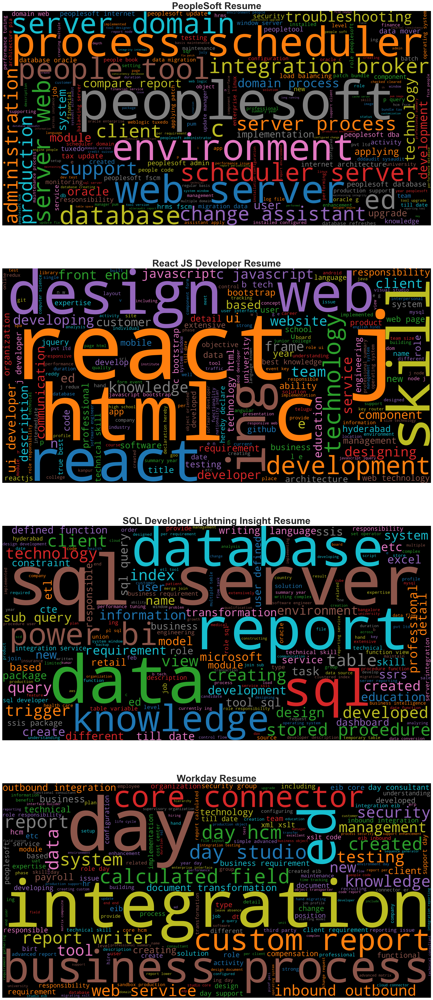

In [43]:
WORDCLOUD_COLOR_MAP = 'tab10_r'
plt.figure(figsize=(64, 56))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(4, 1, i + 1).set_title(category,fontsize=30,fontweight= 'bold')
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

# Model Building

In [44]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.svm import SVC

In [45]:
def predict(model):
    model = model.fit(xtrain, ytrain)
    ypred = model.predict(xtest)
    
    trainac = model.score(xtrain, ytrain)
    testac = model.score(xtest, ytest)
    
    print(f"Train accuracy {trainac}\nTest accuracy {testac}")
    
    print(classification_report(ytest, ypred))

In [46]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [47]:
tf =  TfidfVectorizer(ngram_range=(2,2))
x = tf.fit_transform(df['Resumes'])

x = pd.DataFrame(x.toarray(), columns=tf.get_feature_names_out())
x


,ab software,abdul sharuk,ability build,ability building,ability communication,ability convey,ability create,ability creatively,ability deal,ability efficiently,...,zenefits day,zenefits hr,zenefits servicenow,zero line,zerozilla month,zerozilla software,zone production,zp high,ﬁnding ﬁts,ﬁts current
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.052422,0.052422,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
77,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.035228,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0


In [48]:
df['Category'].unique()

array(['React JS Developer Resume', 'PeopleSoft Resume', 'Workday Resume',
       'SQL Developer Lightning Insight Resume'], dtype=object)

In [49]:
df.to_csv("clean_resume.csv")

In [50]:
label= LabelEncoder()

df['labels'] = label.fit_transform(df['Category'])

In [51]:
df['labels'].unique()

array([1, 0, 3, 2])

In [52]:
df

,Resumes,Category,Length,labels
0,name ravali p curriculum vitae specialization ...,React JS Developer Resume,553,1
1,susovan bag seeking challenging position field...,React JS Developer Resume,159,1
2,kanumuru deepak reddy career objective secure ...,React JS Developer Resume,387,1
3,haripriya battina ui developer reactjs javascr...,React JS Developer Resume,255,1
4,kamalakar reddy linked professional summary ye...,React JS Developer Resume,255,1
...,...,...,...,...
74,sql server developer p syam kumar professional...,SQL Developer Lightning Insight Resume,350,2
75,raju pavana kumari professional summary year p...,SQL Developer Lightning Insight Resume,380,2
76,resume ramalakshmi k career objective professi...,SQL Developer Lightning Insight Resume,415,2
77,name ramesh career objective contribute organi...,SQL Developer Lightning Insight Resume,700,2


In [53]:
y = df['labels']

In [54]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=1)

In [55]:
predict(LogisticRegression())

Train accuracy 1.0
Test accuracy 0.625
              precision    recall  f1-score   support

           0       1.00      0.75      0.86         4
           1       0.14      1.00      0.25         1
           2       0.00      0.00      0.00         4
           3       1.00      0.86      0.92         7

    accuracy                           0.62        16
   macro avg       0.54      0.65      0.51        16
weighted avg       0.70      0.62      0.63        16



In [56]:
predict(DecisionTreeClassifier())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [57]:
predict(RandomForestClassifier())

Train accuracy 1.0
Test accuracy 0.8125
              precision    recall  f1-score   support

           0       1.00      0.75      0.86         4
           1       0.25      1.00      0.40         1
           2       1.00      0.75      0.86         4
           3       1.00      0.86      0.92         7

    accuracy                           0.81        16
   macro avg       0.81      0.84      0.76        16
weighted avg       0.95      0.81      0.86        16



In [58]:
predict(AdaBoostClassifier())

Train accuracy 0.746031746031746
Test accuracy 0.6875
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       0.17      1.00      0.29         1
           2       1.00      1.00      1.00         4
           3       1.00      0.86      0.92         7

    accuracy                           0.69        16
   macro avg       0.54      0.71      0.55        16
weighted avg       0.70      0.69      0.67        16



In [59]:
predict(GradientBoostingClassifier())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [60]:
predict(GaussianNB())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [61]:
predict(SVC())

Train accuracy 1.0
Test accuracy 0.5
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         4
           1       0.11      1.00      0.20         1
           2       0.00      0.00      0.00         4
           3       1.00      0.71      0.83         7

    accuracy                           0.50        16
   macro avg       0.53      0.55      0.42        16
weighted avg       0.69      0.50      0.54        16



In [62]:
predict(KNeighborsClassifier())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



# Unigram Model

In [63]:
tf =  TfidfVectorizer(ngram_range=(1,1))
x = tf.fit_transform(df['Resumes'])

x = pd.DataFrame(x.toarray(), columns=tf.get_feature_names_out())
x


,ab,abdul,ability,able,abreast,absence,absent,abstract,abstraction,ac,...,young,yr,zealand,zenefits,zero,zerozilla,zone,zp,ﬁnding,ﬁts
0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.051179,0.0,...,0.0,0.0,0.0,0.0,0.0,0.102358,0.0,0.0,0.0,0.0
1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
2,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
3,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
4,0.0,0.0,0.033389,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
75,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
76,0.0,0.0,0.022168,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
77,0.0,0.0,0.028462,0.0,0.0,0.0,0.0,0.069641,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


In [64]:
y = df['labels']

In [65]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=1)

In [66]:
predict(LogisticRegression())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [67]:
predict(AdaBoostClassifier())

Train accuracy 0.9682539682539683
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [68]:
predict(GradientBoostingClassifier())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [69]:
predict(GaussianNB())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [70]:
predict(DecisionTreeClassifier())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



In [71]:
predict(RandomForestClassifier())

Train accuracy 1.0
Test accuracy 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



# Pipeline

In [72]:
from sklearn.pipeline import Pipeline

In [73]:
data= pd.read_csv(r'clean_resume.csv', usecols=['Resumes','Category'])

In [74]:
data

,Resumes,Category
0,name ravali p curriculum vitae specialization ...,React JS Developer Resume
1,susovan bag seeking challenging position field...,React JS Developer Resume
2,kanumuru deepak reddy career objective secure ...,React JS Developer Resume
3,haripriya battina ui developer reactjs javascr...,React JS Developer Resume
4,kamalakar reddy linked professional summary ye...,React JS Developer Resume
...,...,...
74,sql server developer p syam kumar professional...,SQL Developer Lightning Insight Resume
75,raju pavana kumari professional summary year p...,SQL Developer Lightning Insight Resume
76,resume ramalakshmi k career objective professi...,SQL Developer Lightning Insight Resume
77,name ramesh career objective contribute organi...,SQL Developer Lightning Insight Resume


In [75]:
xtrain,xtest,ytrain,ytest = train_test_split(data['Resumes'],data['Category'],test_size=0.2,random_state=1)

In [76]:
# Define pipeline
model = Pipeline([
    ('tfidf', TfidfVectorizer(ngram_range=(2,2))),
    ('model', GradientBoostingClassifier(n_estimators=200, random_state=1))
])

In [77]:
model.fit(xtrain, ytrain)       # Train model using pipeline
y_pred = model.predict(xtest)   # Evaluate model on testing set
print(classification_report(ytest, y_pred))

                                        precision    recall  f1-score   support

                     PeopleSoft Resume       1.00      1.00      1.00         4
             React JS Developer Resume       1.00      1.00      1.00         1
SQL Developer Lightning Insight Resume       1.00      1.00      1.00         4
                        Workday Resume       1.00      1.00      1.00         7

                              accuracy                           1.00        16
                             macro avg       1.00      1.00      1.00        16
                          weighted avg       1.00      1.00      1.00        16



# Model Saving

In [78]:
import pickle

In [79]:
#pickle.dump(model, open('model.pkl','wb'))